In [1]:
import ensaio
import pooch
import verde as vd
import harmonica as hm
import matplotlib.pyplot as plt
import pyproj
import numpy as np
import pandas as pd
import xarray as xr
import pyproj
import pygmt
import boule as bl

Convert the global free air anomaly grid to gravity disturbance and calculate the Bouguer disturbance, in a reproducible way.
https://topex.ucsd.edu/cgi-bin/get_data.cgi

In [2]:
region = (-161, -149, -41, -29)
## load in the topography grid from the sandwell dataset
topography_small = pd.read_csv('oorca_topex_topo_small.csv',header = None)
## load in the free air anomaly
fa_grav_small = pd.read_csv('oorca_topex_grav_small.csv',header = None)
## change columns
topography_small.columns = ['Longitude','Latitude','Elevation']
fa_grav_small.columns = ['Longitude','Latitude','FA']
elevation_col = topography_small["Elevation"]
fa_grav_small.insert(2,"Elevation",elevation_col)
## longitude from -360 360 need -180 180
long_sub = fa_grav_small["Longitude"] - 360
fa_grav_small = fa_grav_small.drop(columns=['Longitude'])
fa_grav_small.insert(0,"Longitude",long_sub)
data = fa_grav_small
data.head()

,Longitude,Latitude,Elevation,FA
0,-160.9917,-29.0009,-5412,0.3
1,-160.9750,-29.0009,-5400,1.4
2,-160.9583,-29.0009,-5396,2.4
3,-160.9417,-29.0009,-5415,2.7
4,-160.9250,-29.0009,-5409,2.2


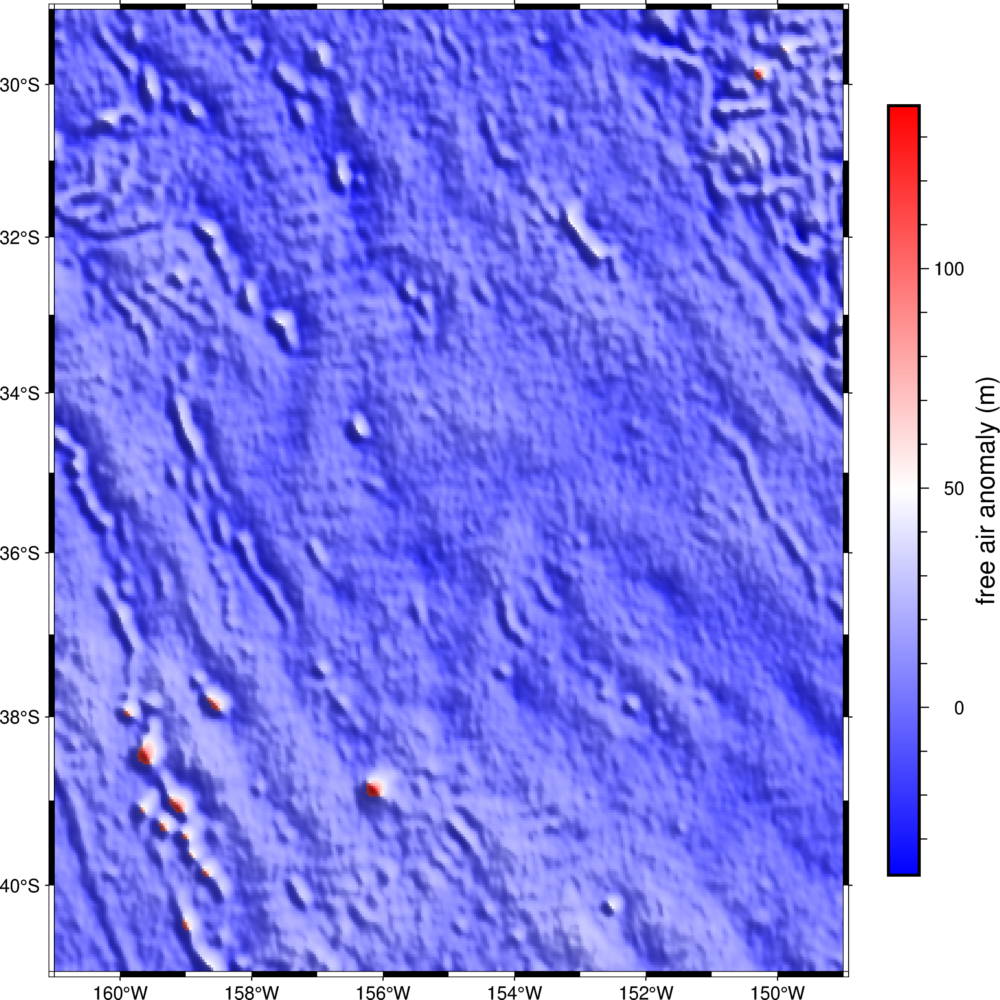

In [3]:
## plot free air anomaly
fa_data = fa_grav_small[['Longitude','Latitude','FA']].copy()
fa_data_grid = pygmt.xyz2grd(data=fa_data,spacing='2m',region=region)

fig = pygmt.Figure()
fig.grdimage(grid=fa_data_grid,region=region,frame=True,projection="M15c",cmap="polar",shading="+a45+nt0.7")
fig.colorbar(frame='af+l"free air anomaly (m)"',position="JMR")
fig.show()

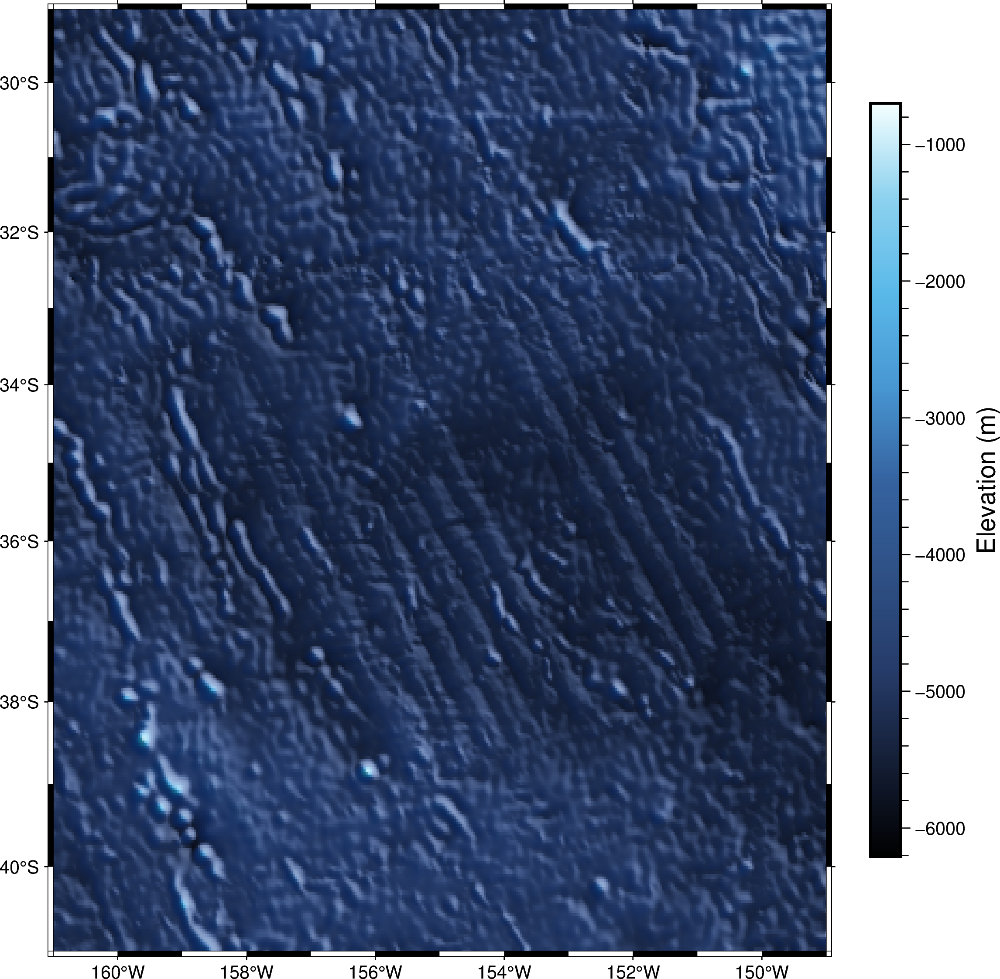

In [4]:
## make topography into grid for corrections
topography = pygmt.xyz2grd(data=topography_small,spacing='2m',region=region)
fig = pygmt.Figure()
fig.grdimage(grid=topography,region=region,frame=True,projection="M15c",cmap="geo",shading="+a45+nt0.7")
fig.colorbar(frame='af+l"Elevation (m)"',position="JMR")
fig.show()

In [5]:
path_geoid = ensaio.fetch_earth_geoid(version=1)
geoid = xr.load_dataarray(path_geoid)

In [6]:
### pad the region

region_pad = vd.pad_region(region, pad=5)
data = data[vd.inside((data.Longitude, data.Latitude), region)]
geoid = geoid.sel(longitude=slice(*region_pad[:2]), latitude=slice(*region_pad[2:]))
topography = topography.sel(lon=slice(*region_pad[:2]), lat=slice(*region_pad[2:]))

projection = pyproj.Proj(proj = 'merc', lat_ts = data.Latitude.mean())

C:\Users\phill\AppData\Local\Temp\ipykernel_13172\1603586898.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['height_sea_level_m'] = orthometric_height


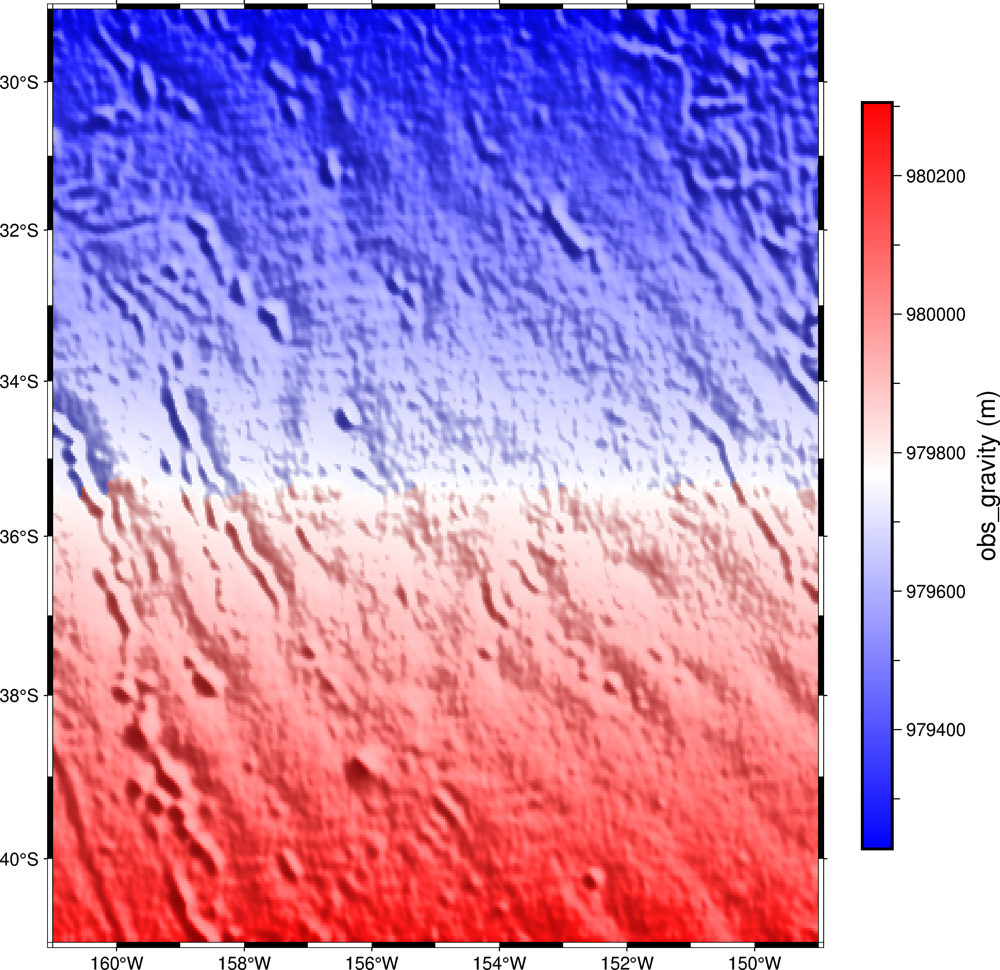

In [7]:
### conver the FA anomaly from sandwell to observed gravity
#observed gravity = free-air anomaly + (normal gravity on sphere + free-air correction -0.3086 * orthometric height)
normal_grav_sphere = bl.GRS80.normal_gravity(data.Latitude,height=0)
fa_corr = -0.3086 #mGal/m
orthometric_height = np.where(data.Elevation<0, 0, data.Elevation)
data['height_sea_level_m'] = orthometric_height

obs_gravity = normal_grav_sphere + fa_corr * data.height_sea_level_m

data = data.assign(gravity = obs_gravity + data.FA)

gravity_data = data[['Longitude','Latitude','gravity']].copy()
gravity_data_grid = pygmt.xyz2grd(data=gravity_data,spacing='2m',region=region)

fig = pygmt.Figure()
fig.grdimage(grid=gravity_data_grid,region=region,frame=True,projection="M15c",cmap="polar",shading="+a45+nt0.7")
fig.colorbar(frame='af+l"obs_gravity (m)"',position="JMR")
fig.show()

In [8]:
easting, northing = projection(data.Longitude.values, data.Latitude.values)
data = data.assign(easting_m=easting, northing_m = northing)

topography_proj = vd.project_grid(topography, projection, method="nearest")
geoid_proj = vd.project_grid(geoid, projection, method="nearest") 

c:\Users\phill\anaconda3\envs\seis_gen\lib\site-packages\verde\base\base_classes.py:463: FutureWarning: The 'spacing', 'shape' and 'region' arguments will be removed in Verde v2.0.0. Please use the 'verde.grid_coordinates' function to define grid coordinates and pass them as the 'coordinates' argument.
  warnings.warn(


In [9]:
geoid_proj = vd.project_grid(geoid, projection, method="nearest")
geoid_interp = geoid_proj.interp_like(topography_proj, kwargs={"fill_value": None}) 
topography_geometric = topography_proj + geoid_interp
topography_geometric

<xarray.DataArray (northing: 361, easting: 361)>
array([[-5168.65      , -5168.67      , -5194.94      , ...,
        -5438.47000008, -5407.76000013, -5354.80000019],
       [-5227.65      , -5227.67      , -5245.44      , ...,
        -5438.97000008, -5390.76000013, -5342.80000019],
       [-5221.06699219, -5221.08699219, -5218.94      , ...,
        -5344.55300789, -5260.42650404, -5268.80000019],
       ...,
       [-5272.57527583, -5272.61527589, -5254.40527595, ...,
        -4736.89867517, -4814.9487856 , -4811.49889603],
       [-5376.06536337, -5376.10536342, -5371.52036348, ...,
        -4790.07125482, -4874.24240029, -4865.28854575],
       [-5376.0554509 , -5376.09545096, -5371.51045102, ...,
        -4790.11883447, -4874.28601497, -4865.32819547]])
Coordinates:
  * easting   (easting) float64 -1.467e+07 -1.467e+07 ... -1.358e+07 -1.358e+07
  * northing  (northing) float64 -4.08e+06 -4.076e+06 ... -2.75e+06 -2.746e+06

In [10]:
geoid_table = vd.grid_to_table(geoid_interp)
interpolator = vd.ScipyGridder(method = 'cubic')
interpolator.fit((geoid_table.easting, geoid_table.northing), geoid_table.geoid)

data = data.assign(geoid_m=interpolator.predict((data.easting_m, data.northing_m)))
data = data.assign(height_geometric_m=data.height_sea_level_m + data.geoid_m)
data.head()


,Longitude,Latitude,Elevation,FA,height_sea_level_m,gravity,easting_m,northing_m,geoid_m,height_geometric_m
0,-160.9917,-29.0009,-5412,0.3,0,979247.836102,-1.467031e+07,-2.746398e+06,7.684350,7.684350
1,-160.9750,-29.0009,-5400,1.4,0,979248.936102,-1.466879e+07,-2.746398e+06,7.664299,7.664299
2,-160.9583,-29.0009,-5396,2.4,0,979249.936102,-1.466727e+07,-2.746398e+06,7.644262,7.644262
3,-160.9417,-29.0009,-5415,2.7,0,979250.236102,-1.466576e+07,-2.746398e+06,7.624336,7.624336
4,-160.9250,-29.0009,-5409,2.2,0,979249.736102,-1.466424e+07,-2.746398e+06,7.604305,7.604305


In [11]:
# Start by placing the continental density above and below the ellipsoid
topography_density = np.where(topography_geometric > 0, 3000, -3000)
# Now correct the value in the oceans (topography < 0)
topography_density = np.where(topography_proj < 0, 1040 - 3000, topography_density)
# Create the prism model of the topographic masses
topography_model = hm.prism_layer(
    coordinates=(topography_geometric.easting, topography_geometric.northing),
    surface=topography_geometric,
    reference=0,
    properties={"density": topography_density}
)
topography_model

<xarray.Dataset>
Dimensions:   (northing: 361, easting: 361)
Coordinates:
  * easting   (easting) float64 -1.467e+07 -1.467e+07 ... -1.358e+07 -1.358e+07
  * northing  (northing) float64 -4.08e+06 -4.076e+06 ... -2.75e+06 -2.746e+06
    top       (northing, easting) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    bottom    (northing, easting) float64 -5.169e+03 -5.169e+03 ... -4.865e+03
Data variables:
    density   (northing, easting) int32 -1960 -1960 -1960 ... -1960 -1960 -1960
Attributes:
    coords_units:      meters
    properties_units:  SI

In [12]:
### calculate gravity disturbance
data=data.assign(normal_gravity_mgal = bl.GRS80.normal_gravity(data.Latitude,data.height_geometric_m))
data=data.assign(gravity_disturbance_mgal=data.gravity - data.normal_gravity_mgal)
### calculate free air anomaly
data = data.assign(fa_normal_grav = bl.GRS80.normal_gravity(data.Latitude,0))
data = data.assign(free_air_anomaly = data.gravity - (data.fa_normal_grav - 0.3086*(data.Elevation)))
data.head()

c:\Users\phill\anaconda3\envs\seis_gen\lib\site-packages\boule\ellipsoid.py:458: UserWarning: Formulas used are valid for points outside the ellipsoid.Height must be greater than or equal to zero.
  warn(


,Longitude,Latitude,Elevation,FA,height_sea_level_m,gravity,easting_m,northing_m,geoid_m,height_geometric_m,normal_gravity_mgal,gravity_disturbance_mgal,fa_normal_grav,free_air_anomaly
0,-160.9917,-29.0009,-5412,0.3,0,979247.836102,-1.467031e+07,-2.746398e+06,7.684350,7.684350,979245.164128,2.671974,979247.536102,-1669.8432
1,-160.9750,-29.0009,-5400,1.4,0,979248.936102,-1.466879e+07,-2.746398e+06,7.664299,7.664299,979245.170317,3.765785,979247.536102,-1665.0400
2,-160.9583,-29.0009,-5396,2.4,0,979249.936102,-1.466727e+07,-2.746398e+06,7.644262,7.644262,979245.176502,4.759600,979247.536102,-1662.8056
3,-160.9417,-29.0009,-5415,2.7,0,979250.236102,-1.466576e+07,-2.746398e+06,7.624336,7.624336,979245.182653,5.053449,979247.536102,-1668.3690
4,-160.9250,-29.0009,-5409,2.2,0,979249.736102,-1.466424e+07,-2.746398e+06,7.604305,7.604305,979245.188836,4.547266,979247.536102,-1667.0174


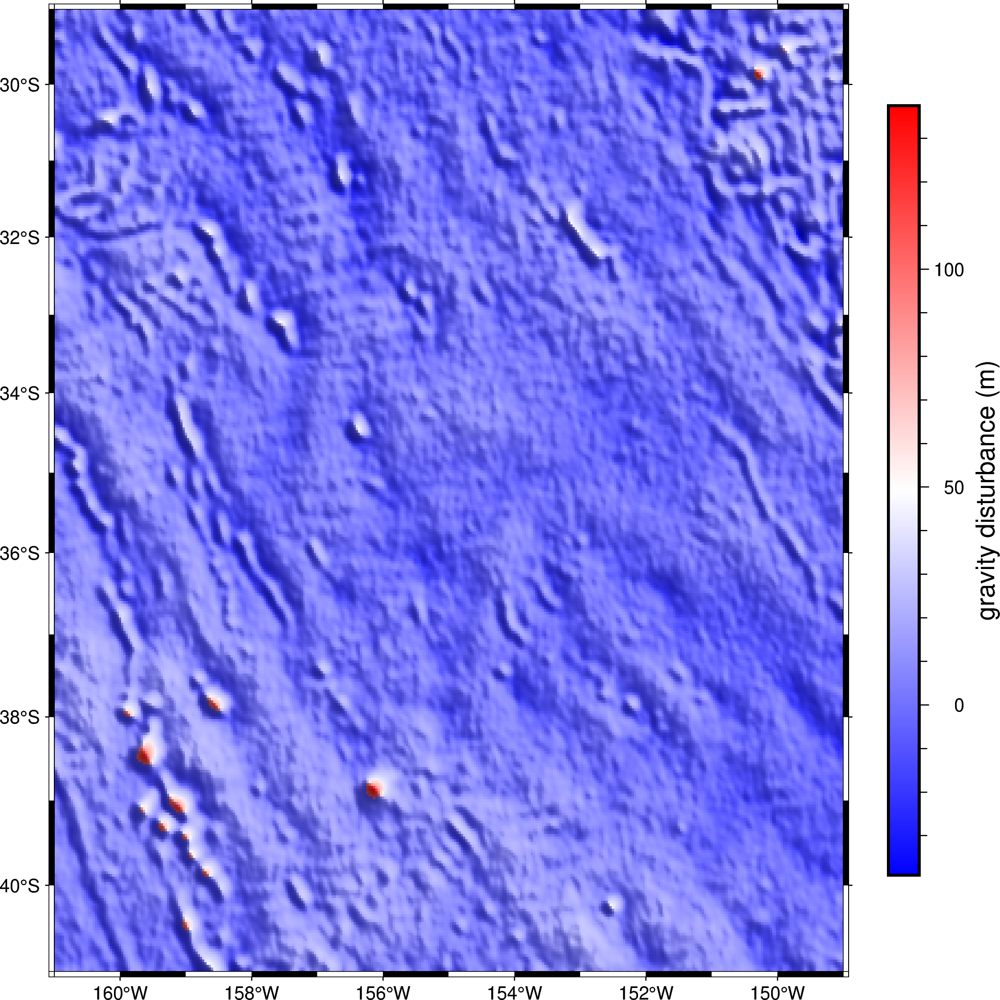

In [13]:
## plot gravity disturbance
gravity_disturbance_data = data[['Longitude','Latitude','gravity_disturbance_mgal']].copy()
gravity_disturbance_data_grid = pygmt.xyz2grd(data=gravity_disturbance_data,spacing='2m',region=region)

fig = pygmt.Figure()
fig.grdimage(grid=gravity_disturbance_data_grid,region=region,frame=True,projection="M15c",cmap="polar",shading="+a45+nt0.7")
fig.colorbar(frame='af+l"gravity disturbance (m)"',position="JMR")
fig.show()

In [15]:
## takes 67 mins
coordinates = (data.easting_m, data.northing_m, data.height_geometric_m)
data = data.assign(terrain_effect_mgal=topography_model.prism_layer.gravity(coordinates, field="g_z"), )

data = data.assign(gravity_bouguer_dist_mgal=data.gravity_disturbance_mgal
 - data.terrain_effect_mgal) 
data.head()

,Longitude,Latitude,Elevation,FA,height_sea_level_m,gravity,easting_m,northing_m,geoid_m,height_geometric_m,normal_gravity_mgal,gravity_disturbance_mgal,fa_normal_grav,free_air_anomaly,terrain_effect_mgal,gravity_bouguer_dist_mgal
0,-160.9917,-29.0009,-5412,0.3,0,979247.836102,-1.467031e+07,-2.746398e+06,7.684350,7.684350,979245.164128,2.671974,979247.536102,-1669.8432,-255.177724,257.849698
1,-160.9750,-29.0009,-5400,1.4,0,979248.936102,-1.466879e+07,-2.746398e+06,7.664299,7.664299,979245.170317,3.765785,979247.536102,-1665.0400,-275.552596,279.318381
2,-160.9583,-29.0009,-5396,2.4,0,979249.936102,-1.466727e+07,-2.746398e+06,7.644262,7.644262,979245.176502,4.759600,979247.536102,-1662.8056,-287.200987,291.960587
3,-160.9417,-29.0009,-5415,2.7,0,979250.236102,-1.466576e+07,-2.746398e+06,7.624336,7.624336,979245.182653,5.053449,979247.536102,-1668.3690,-294.516318,299.569767
4,-160.9250,-29.0009,-5409,2.2,0,979249.736102,-1.466424e+07,-2.746398e+06,7.604305,7.604305,979245.188836,4.547266,979247.536102,-1667.0174,-299.511913,304.059179


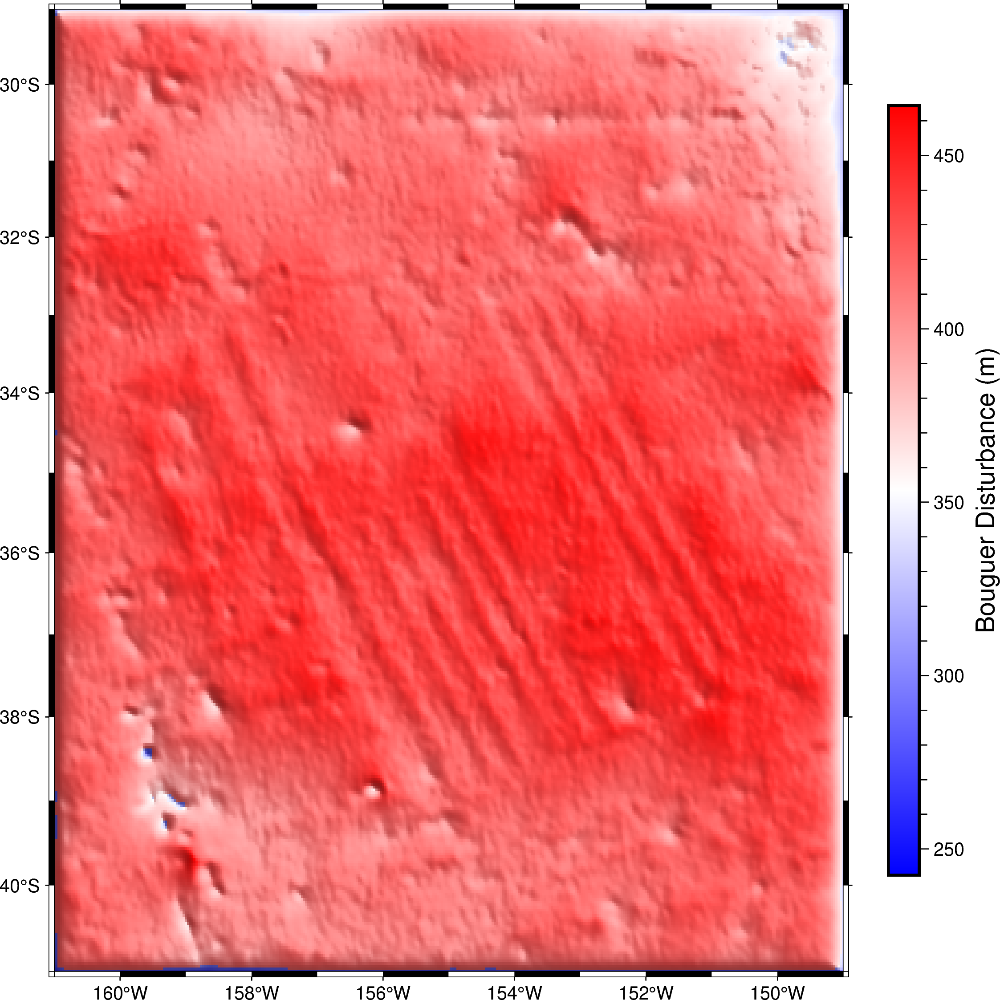

In [16]:
## plot gravity disturbance
gravity_bouguer_dist_data = data[['Longitude','Latitude','gravity_bouguer_dist_mgal']].copy()
gravity_bouguer_dist_data_grid = pygmt.xyz2grd(data=gravity_bouguer_dist_data,spacing='2m',region=region)

fig = pygmt.Figure()
fig.grdimage(grid=gravity_bouguer_dist_data_grid,region=region,frame=True,projection="M15c",cmap="polar",shading="+a45+nt0.7")
fig.colorbar(frame='af+l"Bouguer Disturbance (m)"',position="JMR")
fig.show()

In [17]:
trend_1 = vd.Trend(degree=1)
trend_1.fit(coordinates, data.gravity_bouguer_dist_mgal)

residuals_1 = data.gravity_bouguer_dist_mgal - trend_1.predict(coordinates)

# Compute the trend from the Bouguer disturbance using a second-order polynomial:
trend_2 = vd.Trend(degree=2)
trend_2.fit(coordinates, data.gravity_bouguer_dist_mgal)

# Remove the trend from the Bouguer disturbance:
residuals_2 = data.gravity_bouguer_dist_mgal - trend_2.predict(coordinates)

trend_3 = vd.Trend(degree=3)
trend_3.fit(coordinates, data.gravity_bouguer_dist_mgal)

residuals_3 = data.gravity_bouguer_dist_mgal - trend_3.predict(coordinates)

In [18]:
data = data.assign(bouguer_residuals_1=residuals_1)
data = data.assign(bouguer_residuals_2=residuals_2)
data = data.assign(bouguer_residuals_3=residuals_3)

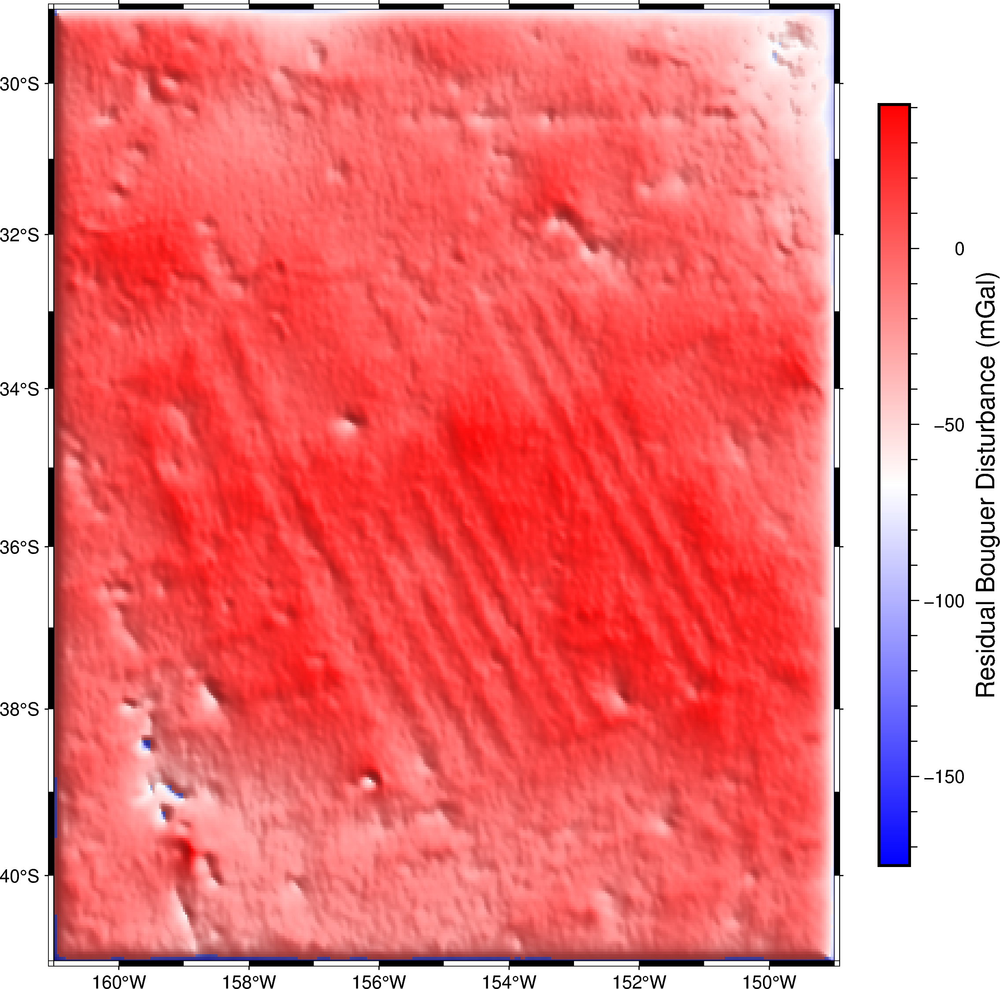

In [19]:
## plot gravity disturbance
resid1_gravity_bouguer_dist_data = data[['Longitude','Latitude','bouguer_residuals_1']].copy()
resid_1gravity_bouguer_dist_data_grid = pygmt.xyz2grd(data=resid1_gravity_bouguer_dist_data,spacing='2m',region=region)

fig = pygmt.Figure()
fig.grdimage(grid=resid_1gravity_bouguer_dist_data_grid,region=region,frame=True,projection="M15c",cmap="polar",shading="+a45+nt0.7")
fig.colorbar(frame='af+l"Residual Bouguer Disturbance (mGal)"',position="JMR")
fig.show()

In [22]:
## save the data for future plotting
import os

outname = 'bouguer_disturbance_oorca_2132023.txt'

outdir = './oorcaBouguer'
if not os.path.exists(outdir):
    os.mkdir(outdir)

fullname = os.path.join(outdir, outname)    

data.to_csv(fullname,index=False,sep=' ')
#data.to_csv("./oorcaBouguer/bouguer_disturbance_oorca_2132023.txt", index=False, sep = ' ')

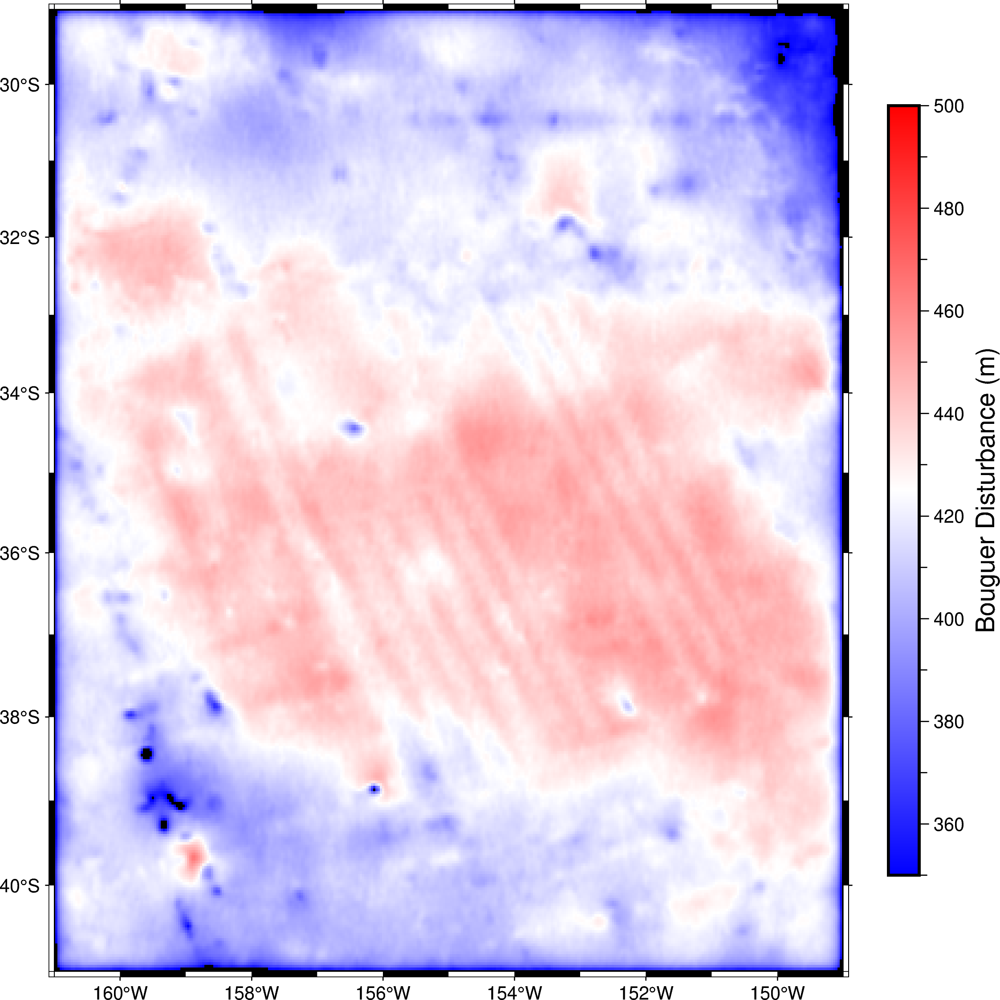

In [2]:
### read in the txt file for future figures/processing
import pygmt
import pandas as pd
region = (-161, -149, -41, -29)
data = pd.read_csv("./oorcaBouguer/bouguer_disturbance_oorca_2132023.txt", sep = ' ')

## plot gravity disturbance
gravity_bouguer_dist_data = data[['Longitude','Latitude','gravity_bouguer_dist_mgal']].copy()
gravity_bouguer_dist_data_grid = pygmt.xyz2grd(data=gravity_bouguer_dist_data,spacing='2m',region=region)

fig = pygmt.Figure()
#pygmt.makecpt(cmap="polar",series=[data.gravity_bouguer_dist_mgal.min(),data.gravity_bouguer_dist_mgal.max()])
pygmt.makecpt(cmap="polar",series=[350,500])
fig.grdimage(grid=gravity_bouguer_dist_data_grid,region=region,frame=True,projection="M15c",cmap=True)#,shading="+a45+nt0.7")
fig.colorbar(frame='af+l"Bouguer Disturbance (m)"',position="JMR")
fig.show()

In [3]:
data.head()

,Longitude,Latitude,Elevation,FA,height_sea_level_m,gravity,easting_m,northing_m,geoid_m,height_geometric_m,normal_gravity_mgal,gravity_disturbance_mgal,fa_normal_grav,free_air_anomaly,terrain_effect_mgal,gravity_bouguer_dist_mgal,bouguer_residuals_1,bouguer_residuals_2,bouguer_residuals_3
0,-160.9917,-29.0009,-5412,0.3,0,979247.836102,-1.467031e+07,-2.746398e+06,7.684350,7.684350,979245.164128,2.671974,979247.536102,-1669.8432,-255.177724,257.849698,-157.373400,-134.812473,-144.367534
1,-160.9750,-29.0009,-5400,1.4,0,979248.936102,-1.466879e+07,-2.746398e+06,7.664299,7.664299,979245.170317,3.765785,979247.536102,-1665.0400,-275.552596,279.318381,-135.908256,-113.384113,-122.870263
2,-160.9583,-29.0009,-5396,2.4,0,979249.936102,-1.466727e+07,-2.746398e+06,7.644262,7.644262,979245.176502,4.759600,979247.536102,-1662.8056,-287.200987,291.960587,-123.269588,-100.781988,-110.199824
3,-160.9417,-29.0009,-5415,2.7,0,979250.236102,-1.466576e+07,-2.746398e+06,7.624336,7.624336,979245.182653,5.053449,979247.536102,-1668.3690,-294.516318,299.569767,-115.663926,-93.212410,-102.562929
4,-160.9250,-29.0009,-5409,2.2,0,979249.736102,-1.466424e+07,-2.746398e+06,7.604305,7.604305,979245.188836,4.547266,979247.536102,-1667.0174,-299.511913,304.059179,-111.178052,-88.762599,-98.045985


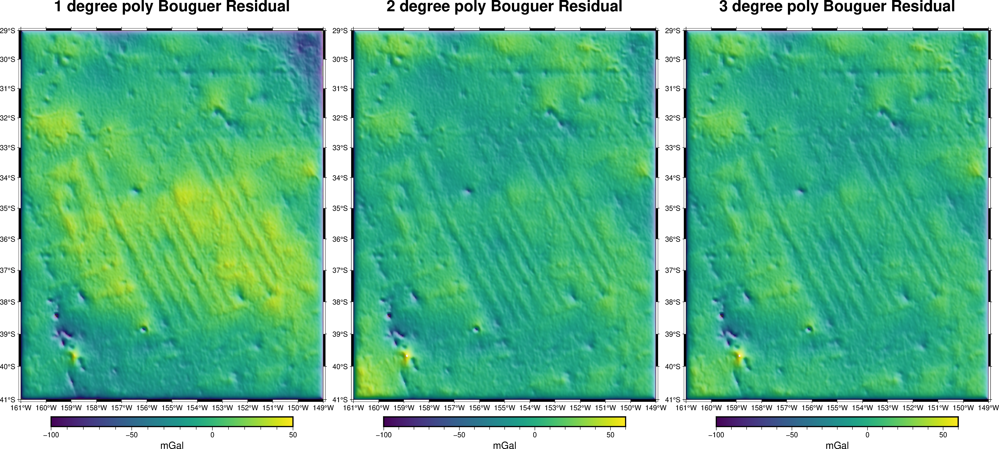

In [4]:
resid1_gravity_bouguer_dist_data = data[['Longitude','Latitude','bouguer_residuals_1']].copy()
resid_1gravity_bouguer_dist_data_grid = pygmt.xyz2grd(data=resid1_gravity_bouguer_dist_data,spacing='2m',region=region)

resid2_gravity_bouguer_dist_data = data[['Longitude','Latitude','bouguer_residuals_2']].copy()
resid_2gravity_bouguer_dist_data_grid = pygmt.xyz2grd(data=resid2_gravity_bouguer_dist_data,spacing='2m',region=region)

resid3_gravity_bouguer_dist_data = data[['Longitude','Latitude','bouguer_residuals_3']].copy()
resid_3gravity_bouguer_dist_data_grid = pygmt.xyz2grd(data=resid3_gravity_bouguer_dist_data,spacing='2m',region=region)

fig = pygmt.Figure()
pygmt.makecpt(cmap="viridis",series=[-100,50])
fig.grdimage(grid = resid_1gravity_bouguer_dist_data_grid,region = region,frame=['WSrt+t"1 degree poly Bouguer Residual"',"xa1","ya1"]
,projection="M15c",cmap=True,shading="+a45+nt0.7",nan_transparent=True)
fig.colorbar(frame=["x+lmGal"])

fig.shift_origin(xshift="16.5c")
pygmt.makecpt(cmap="viridis",series=[-100,60])
fig.grdimage(grid = resid_2gravity_bouguer_dist_data_grid,region = region,frame=['WSrt+t"2 degree poly Bouguer Residual"',"xa1","ya1"]
,projection="M15c",cmap=True,shading="+a45+nt0.7",nan_transparent=True)
fig.colorbar(frame=["x+lmGal"])

fig.shift_origin(xshift="16.5")
pygmt.makecpt(cmap="viridis",series=[-100,60])
fig.grdimage(grid = resid_3gravity_bouguer_dist_data_grid,region = region,frame=['WSrt+t"3 degree poly Bouguer Residual"',"xa1","ya1"]
,projection="M15c",cmap=True,shading="+a45+nt0.7",nan_transparent=True)
fig.colorbar(frame=["x+lmGal"])
fig.show()

In [5]:
### filter the residuals now
resid_1gravity_bouguer_dist_data_grid = pygmt.grdfilter(grid=resid_1gravity_bouguer_dist_data_grid,filter='g40',distance='2')
resid_2gravity_bouguer_dist_data_grid = pygmt.grdfilter(grid=resid_2gravity_bouguer_dist_data_grid,filter='g40',distance='2')
resid_3gravity_bouguer_dist_data_grid = pygmt.grdfilter(grid=resid_3gravity_bouguer_dist_data_grid,filter='g40',distance='2')

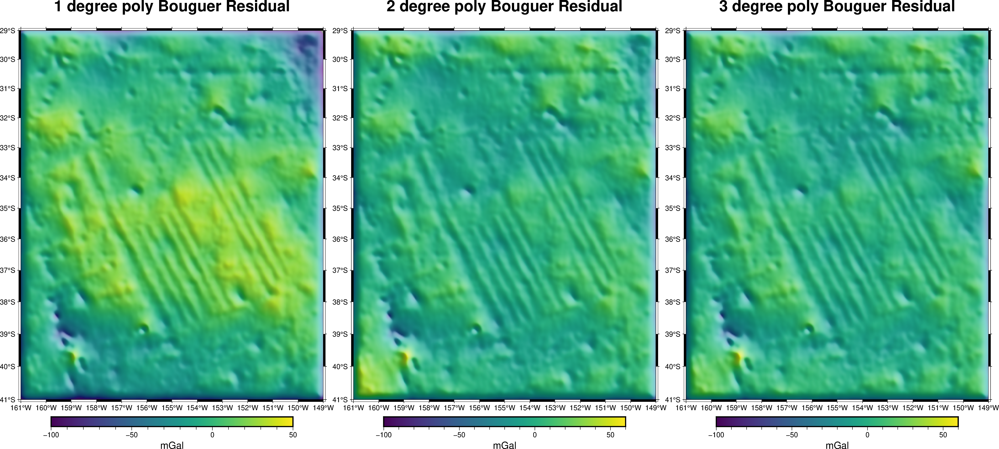

In [6]:
fig = pygmt.Figure()
pygmt.makecpt(cmap="viridis",series=[-100,50])
fig.grdimage(grid = resid_1gravity_bouguer_dist_data_grid,region = region,frame=['WSrt+t"1 degree poly Bouguer Residual"',"xa1","ya1"]
,projection="M15c",cmap=True,shading="+a45+nt0.7",nan_transparent=True)
fig.colorbar(frame=["x+lmGal"])

fig.shift_origin(xshift="16.5c")
pygmt.makecpt(cmap="viridis",series=[-100,60])
fig.grdimage(grid = resid_2gravity_bouguer_dist_data_grid,region = region,frame=['WSrt+t"2 degree poly Bouguer Residual"',"xa1","ya1"]
,projection="M15c",cmap=True,shading="+a45+nt0.7",nan_transparent=True)
fig.colorbar(frame=["x+lmGal"])

fig.shift_origin(xshift="16.5")
pygmt.makecpt(cmap="viridis",series=[-100,60])
fig.grdimage(grid = resid_3gravity_bouguer_dist_data_grid,region = region,frame=['WSrt+t"3 degree poly Bouguer Residual"',"xa1","ya1"]
,projection="M15c",cmap=True,shading="+a45+nt0.7",nan_transparent=True)
fig.colorbar(frame=["x+lmGal"])
fig.show()

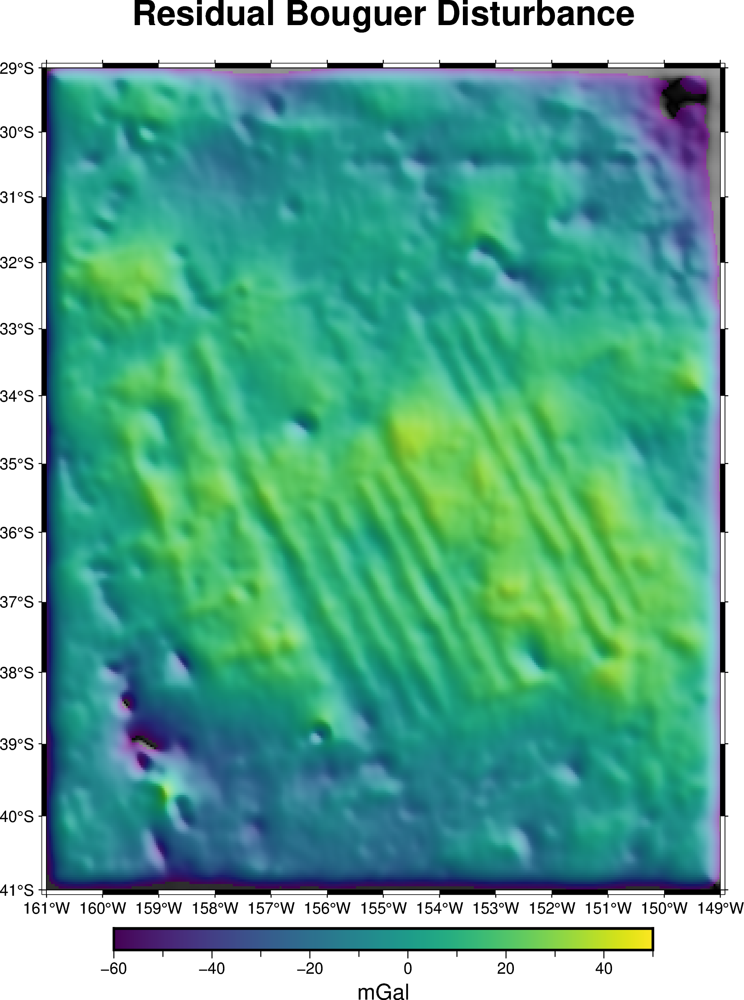

In [7]:
### filtered residual bouguer disturbance grid
fig = pygmt.Figure()
pygmt.makecpt(cmap="viridis",series=[-60,50])
fig.grdimage(grid = resid_1gravity_bouguer_dist_data_grid,region = region,frame=['WSrt+t"Residual Bouguer Disturbance"',"xa1","ya1"]
,projection="M15c",cmap=True,shading="+a45+nt0.7",nan_transparent=True)
fig.colorbar(frame=["x+lmGal"])
fig.show()

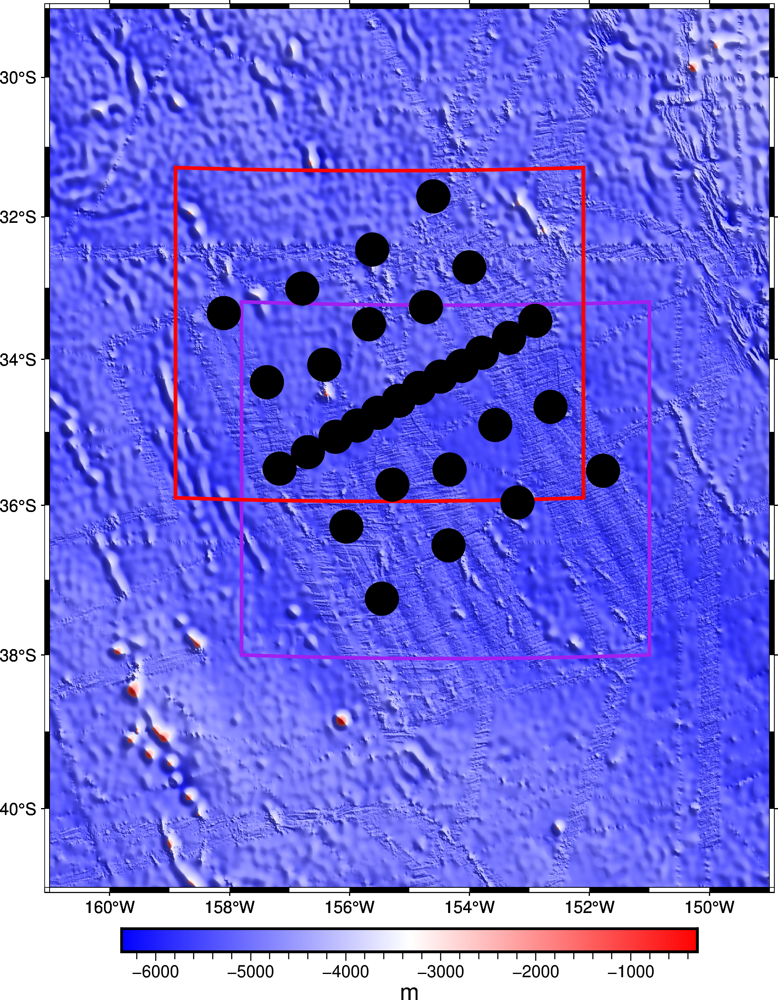

In [8]:
from pygmt.datasets import load_earth_relief, load_earth_age
# get remote topography
high_res_topo_grd = load_earth_relief(resolution="15s",region = region)

	# gmt plot stalist_good22.txt -R175W/130W/50S/20S -JM10c -Sd0.15c -Gyellow2 -W0.2p,black
	# gmt plot stalist_bad7.txt -R175W/130W/50S/20S -JM10c -Sd0.15c -Gred -W0.2p,black
	# gmt plot stalist_badH.txt -R175W/130W/50S/20S -JM10c -Sd0.15c -Gpurple -W0.2p,black
stalist_good22 = pd.read_csv('stalist_good22.txt',header=None,sep='\t')
stalist_bad7 = pd.read_csv('stalist_bad7.txt',header=None,sep='\t')
stalist_badH = pd.read_csv('stalist_badH.txt',header=None,sep='\t')

fig = pygmt.Figure()
fig.grdimage(grid = high_res_topo_grd,region = region,frame=True,projection="M15c",cmap="polar",shading="+a45+nt0.7",nan_transparent=True)
north_region_old = [-158.9,-152.1,-35.9,-31.3] 
south_region_old = [-157.8,-151,-38,-33.2]
north_region_new = [-157.471219,-154.322375,-34.787533,-32.406118]
south_region_new = [-156.527621,-152.585142,-36.776967,-33.970033]

north_rec_old = [[north_region_old[0],north_region_old[2],north_region_old[1],north_region_old[3]]]
south_rec_old = [[south_region_old[0],south_region_old[2],south_region_old[1],south_region_old[3]]]
north_rec_new = [[north_region_new[0],north_region_new[2],north_region_new[1],north_region_new[3]]]
south_rec_new = [[south_region_new[0],south_region_new[2],south_region_new[1],south_region_new[3]]]

fig.plot(data=south_rec_old,style="r+s",pen="2p,purple")
fig.plot(data=north_rec_old,style="r+s",pen="2p,red")
fig.plot(region = region,x=stalist_good22[0],y=stalist_good22[1],pen="black",frame=True,style="c0.7c",color="black")
fig.plot(region = region,x=stalist_bad7[0],y=stalist_bad7[1],pen="black",frame=True,style="c0.7c",color="black")
fig.plot(region = region,x=stalist_badH[0],y=stalist_badH[1],pen="black",frame=True,style="c0.7c",color="black")
fig.colorbar(frame=["x+lm"])
fig.show()

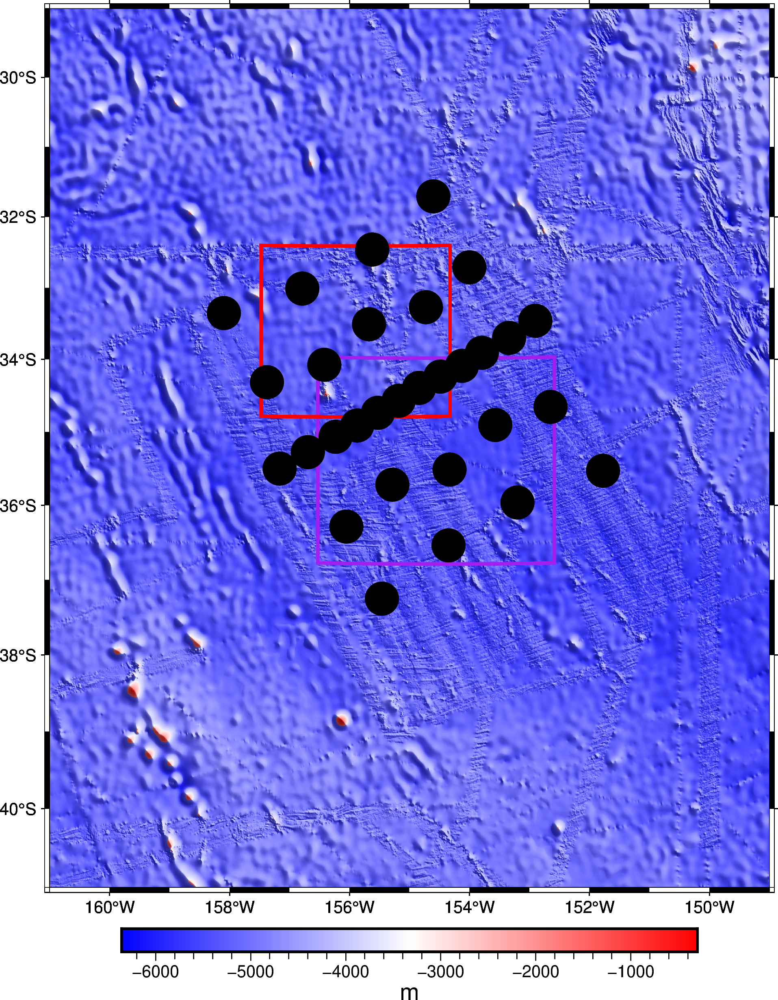

In [9]:
fig = pygmt.Figure()
fig.grdimage(grid = high_res_topo_grd,region = region,frame=True,projection="M15c",cmap="polar",shading="+a45+nt0.7",nan_transparent=True)
north_region_old = [-158.9,-152.1,-35.9,-31.3] 
south_region_old = [-157.8,-151,-38,-33.2]
north_region_new = [-157.471219,-154.322375,-34.787533,-32.406118]
south_region_new = [-156.527621,-152.585142,-36.776967,-33.970033]

north_rec_old = [[north_region_old[0],north_region_old[2],north_region_old[1],north_region_old[3]]]
south_rec_old = [[south_region_old[0],south_region_old[2],south_region_old[1],south_region_old[3]]]
north_rec_new = [[north_region_new[0],north_region_new[2],north_region_new[1],north_region_new[3]]]
south_rec_new = [[south_region_new[0],south_region_new[2],south_region_new[1],south_region_new[3]]]

fig.plot(data=south_rec_new,style="r+s",pen="2p,purple")
fig.plot(data=north_rec_new,style="r+s",pen="2p,red")
fig.plot(region = region,x=stalist_good22[0],y=stalist_good22[1],pen="black",frame=True,style="c0.7c",color="black")
fig.plot(region = region,x=stalist_bad7[0],y=stalist_bad7[1],pen="black",frame=True,style="c0.7c",color="black")
fig.plot(region = region,x=stalist_badH[0],y=stalist_badH[1],pen="black",frame=True,style="c0.7c",color="black")
fig.colorbar(frame=["x+lm"])
fig.show()

In [16]:
### convert grids to xyz and get the mean(median?) seafloor depth for regions
north_grd2xyz_15s = pygmt.grd2xyz(high_res_topo_grd,region=north_region_new,spacing='15s')
south_grd2xyz_15s = pygmt.grd2xyz(high_res_topo_grd,region=south_region_new,spacing='15s')

grd2xyz [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grd2xyz [WARNING]: w reset from -157.471219 to -157.475
grd2xyz [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grd2xyz [WARNING]: e reset from -154.322375 to -154.316666667
grd2xyz [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grd2xyz [WARNING]: s reset from -34.787533 to -34.7916666667
grd2xyz [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grd2xyz [WARNING]: n reset from -32.406118 to -32.4
grd2xyz [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grd2xyz [WARNING]: w reset from -156.527621 to -156.533333333
grd2xyz [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grd2xyz [WARNING]: e reset from -152.585142 to -152.579166667
grd

In [17]:
south_grd2xyz_15s.elevation.median()

-5436.0

In [18]:
south_grd2xyz_15s.elevation.mean()

-5403.975963001991

In [19]:
north_grd2xyz_15s.elevation.median()

-5230.0

In [20]:
north_grd2xyz_15s.elevation.mean()

-5220.039973155102